In [2]:
import librosa
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import Audio, display


In [36]:
def hz_to_bark(hz):
    """Convert a frequency in Hz to the Bark scale."""
    return 13 * np.arctan(0.00076 * hz) + 3.5 * np.arctan((hz / 7500.0) ** 2)

def bark_spectrogram(audio_path, sr=None, n_fft=2048, hop_length=512):
    # Load the audio file
    y, sr = librosa.load(audio_path, sr=sr)
    
    # Compute STFT
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    
    # Convert to power spectrogram
    S = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    return S, sr

def plot_bark_spectrogram(S, sr, n_fft=2048, hop_length=512):
    plt.figure(figsize=(12, 8))
    
    # Display the spectrogram
    img = librosa.display.specshow(S, sr=sr, hop_length=hop_length, x_axis='time', y_axis='hz', cmap='viridis')
    
    plt.colorbar(img, format='%+2.0f dB')
    plt.title('Bark Spectrogram')
    
    # Modify y-axis to show Bark scale
    ax = plt.gca()
    y_ticks = ax.get_yticks()
    bark_ticks = hz_to_bark(y_ticks)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{b:.1f}' for b in bark_ticks])
    plt.ylabel('Bark Scale')
    
    plt.tight_layout()
    plt.show()


def plot_specto_3d_plotly(S, sr, hop_length=512):
    """Create a smooth interactive 3D plot of the Bark spectrogram using Plotly."""
    
    # Generate time and frequency axes
    time = np.arange(S.shape[1]) * hop_length / sr
    frequency = hz_to_bark(librosa.fft_frequencies(sr=sr, n_fft=2*(S.shape[0]-1)))

    # Create a meshgrid for 3D plotting
    T, F = np.meshgrid(time, frequency)
    Z = S  # Spectrogram values (no need to transpose for Plotly)
    
    # Generate hover text for interactivity
    hover_text = [[f"Time: {t:.2f}s<br>Frequency: {f:.2f} Bark<br>Amplitude: {z:.2f} dB"
                   for t, f, z in zip(T_row, F_row, Z_row)]
                  for T_row, F_row, Z_row in zip(T, F, Z)]
    
    # Create a 3D surface plot
    fig = go.Figure(data=[
        go.Surface(z=Z, x=T, y=F, colorscale='Viridis', hoverinfo='text', text=hover_text)
    ])
    
    # Update layout for better interactivity and appearance
    fig.update_layout(
        title='Interactive 3D Bark Spectrogram (Plotly)',
        scene=dict(
            xaxis=dict(title='Time (s)', backgroundcolor='rgb(230, 230, 230)', gridcolor='white'),
            yaxis=dict(title='Bark Scale', backgroundcolor='rgb(230, 230, 230)', gridcolor='white'),
            zaxis=dict(title='Amplitude (dB)', backgroundcolor='rgb(230, 230, 230)', gridcolor='white'),
            bgcolor='rgb(200, 200, 230)'  # Background color for the scene
        ),
        width=900,
        height=700,
        margin=dict(l=0, r=0, b=0, t=40),  # Adjust margins
        paper_bgcolor='rgb(255, 255, 255)',  # Paper background color
        scene_camera=dict(eye=dict(x=-2.5, y=1.5, z=1.5))  # Camera position for better 3D viewing
    )
    
    fig.show()


def plot_spectrogram_with_peaks_bark(S, sr, hop_length=512, n_fft=2048, peaks_list=None, similar_peaks=None):
    # Convert frequency axis to Bark scale
    frequencies = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    bark_frequencies = hz_to_bark(frequencies)

    # Compute the time and Bark-frequency meshgrid
    time = librosa.frames_to_time(np.arange(S.shape[1]), sr=sr, hop_length=hop_length)

    # Plot the Bark spectrogram using the meshgrid
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(time, bark_frequencies, librosa.amplitude_to_db(S, ref=np.max), shading='gouraud', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Bark Spectrogram with Peaks')
    plt.ylabel('Bark Scale')
    plt.xlabel('Time (s)')

    # Mark the peaks on the spectrogram with vertical blue lines for regular peaks
    if peaks_list:
        for peak in peaks_list:
            plt.axvline(x=peak['time'], color='blue', linestyle='--', label='Peak')

    # Mark the similar peaks with red vertical lines
    if similar_peaks:
        for peak in similar_peaks:
            plt.axvline(x=peak['peak_time'], color='red', linestyle='-', label='Similar Peak')

    plt.legend(loc='upper right')
    plt.show()


# Function to process a single audio file and plot the spectrogram and peaks
def process_audio_and_plot(audio_file, sr=None, n_fft=2048, hop_length=512):
    
    # Load the audio file
    y, sr = librosa.load(audio_file, sr=sr)

    # Compute the magnitude spectrogram
    S = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))

    # Find peaks and their details
    peaks_list = find_peaks_and_return_details(S, sr, hop_length=hop_length, n_fft=n_fft)

    # Plot the Bark spectrogram with blue vertical lines for peaks
    #plot_spectrogram_with_peaks_bark(S, sr, hop_length=hop_length, n_fft=n_fft, peaks_list=peaks_list)

    # Collapse the spectrogram across the frequency axis
    decibel_over_time = np.mean(librosa.amplitude_to_db(S, ref=np.max), axis=0)
    
    # Get the peak times
    peak_times = [peak['time'] for peak in peaks_list]

    return S, peaks_list

# Function to process multiple audio files in a folder and store the results in a list
def process_multiple_audio_files(audio_folder, sr=None, n_fft=2048, hop_length=512):
    
    # Initialize an empty list to hold the results for each audio file
    audio_list = []
    
    # Get all audio files in the folder
    audio_files = [f for f in os.listdir(audio_folder) if f.endswith('.wav')]
    
    # Process each audio file
    for audio_file in audio_files:
        print(f'Processing {audio_file}...')
        audio_path = os.path.join(audio_folder, audio_file)
        
        # Display the audio file
        #display(Audio(audio_path))
        
        # Process the audio file and get its spectrogram and peak list
        S, peaks_list = process_audio_and_plot(audio_path, sr=sr, n_fft=n_fft, hop_length=hop_length)
        
        # Add the results to the audio_list
        audio_list.append({
            'audio_file': audio_file,
            'spectrogram': S,
            'peaks_list': peaks_list
        })

    return audio_list

# Function to plot frequency-to-decibel graphs for peaks
def plot_frequency_vs_decibel_for_peaks(audio_list):

    for audio_entry in audio_list:
        audio_file = audio_entry['audio_file']
        peaks_list = audio_entry['peaks_list']

        # For each peak, plot the frequency-to-decibel relationship after normalization
        for i, peak in enumerate(peaks_list):
            frequencies = peak['frequencies']
            decibels = peak['decibels']
            time = peak['time']

            # Normalize decibel values
            decibels_normalized = min_max_normalize(decibels)

            # Plot frequency vs normalized decibel for this peak
            plt.figure(figsize=(10, 4))
            plt.plot(frequencies, decibels_normalized, label=f"Peak at {time:.2f} s", color='blue')
            plt.title(f'Normalized Frequency vs Decibel for Peak {i+1} in {audio_file}')
            plt.xlabel('Frequency (Bark Scale)')
            plt.ylabel('Normalized Decibel (0 to 1)')
            plt.grid(True)
            plt.legend()
            plt.show()

# Function to find peaks and return details
def find_peaks_and_return_details(S, sr, hop_length=512, n_fft=2048, db_threshold=-50):
    
    # Convert the spectrogram to decibels and average over frequency bins to get time-wise decibel levels
    decibel_over_time = np.mean(librosa.amplitude_to_db(S, ref=np.max), axis=0)

    # Find peaks in the decibel-over-time representation
    peaks = librosa.util.peak_pick(decibel_over_time, pre_max=5, post_max=5, pre_avg=5, post_avg=10, delta=0, wait=10)

    # Apply a decibel threshold to ignore low-energy peaks
    valid_peaks = [peak for peak in peaks if decibel_over_time[peak] > db_threshold]

    # Convert peak indices to times
    peak_times = librosa.frames_to_time(valid_peaks, sr=sr, hop_length=hop_length)

    # Frequencies corresponding to the spectrogram rows
    frequencies = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    bark_frequencies = hz_to_bark(frequencies)

    # Initialize list to hold the peak data
    peaks_list = []

    # For each valid time peak, get all decibel values and frequencies at that time
    for peak_index, peak_time in zip(valid_peaks, peak_times):
        decibels_at_time = S[:, peak_index]  # Get decibels for all frequencies at this time
        peak_info = {
            'time': peak_time,
            'frequencies': bark_frequencies,
            'decibels': decibels_at_time
        }
        peaks_list.append(peak_info)

    return peaks_list


In [39]:
# Example usage
audio_folder1 = 'C:/Users/sriuj/Downloads/GunShotAnalysis/Data/gun_shots'
audio_list1 = process_multiple_audio_files(audio_folder1, sr=22050, n_fft=2048, hop_length=512)

audio_folder2 = 'C:/Users/sriuj/Downloads/GunShotAnalysis/Data/output_chunks'
audio_list2 = process_multiple_audio_files(audio_folder2, sr=22050, n_fft=2048, hop_length=512)


Processing chunk_1.wav...
Processing chunk_11.wav...
Processing chunk_12.wav...
Processing chunk_13.wav...
Processing chunk_0.wav...
Processing chunk_1.wav...
Processing chunk_10.wav...
Processing chunk_11.wav...
Processing chunk_12.wav...
Processing chunk_13.wav...
Processing chunk_14.wav...
Processing chunk_15.wav...
Processing chunk_16.wav...
Processing chunk_17.wav...
Processing chunk_18.wav...
Processing chunk_19.wav...
Processing chunk_2.wav...
Processing chunk_20.wav...
Processing chunk_21.wav...
Processing chunk_22.wav...
Processing chunk_23.wav...
Processing chunk_24.wav...
Processing chunk_25.wav...
Processing chunk_26.wav...
Processing chunk_3.wav...
Processing chunk_4.wav...
Processing chunk_5.wav...
Processing chunk_6.wav...
Processing chunk_7.wav...
Processing chunk_8.wav...
Processing chunk_9.wav...


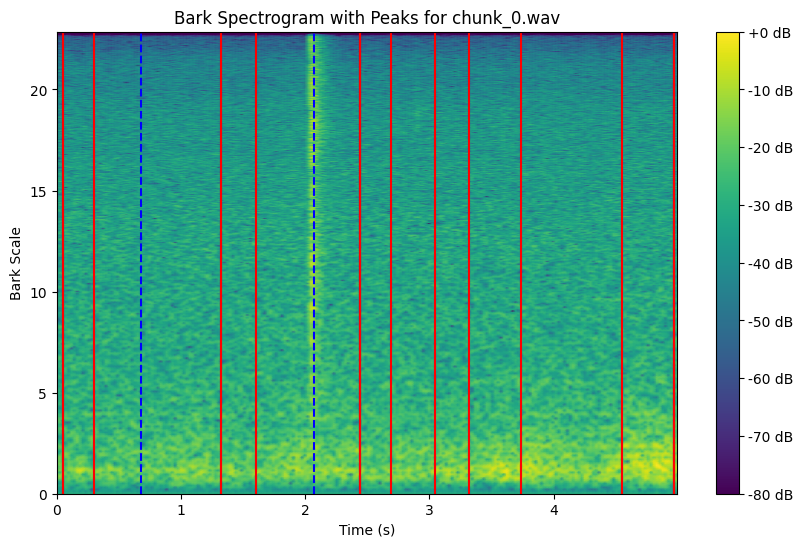

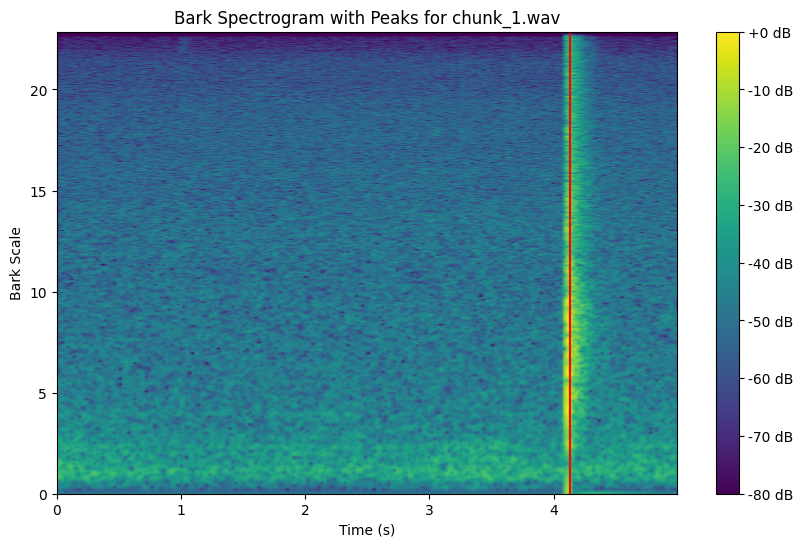

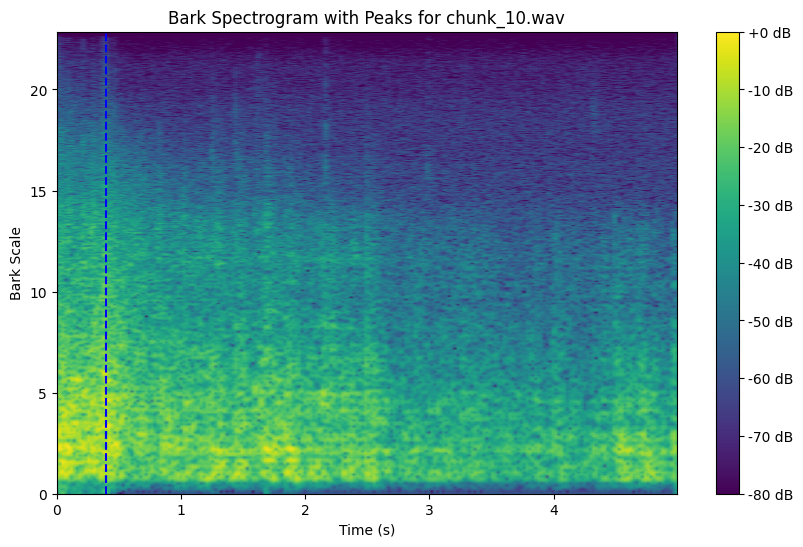

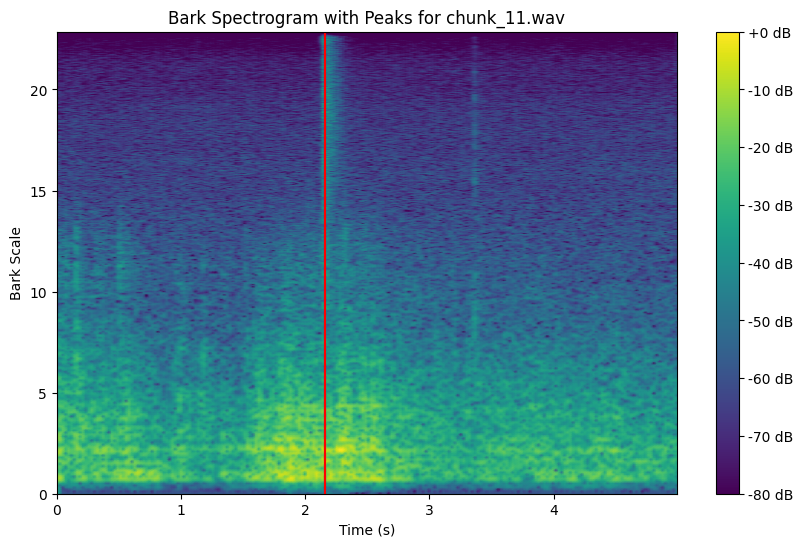

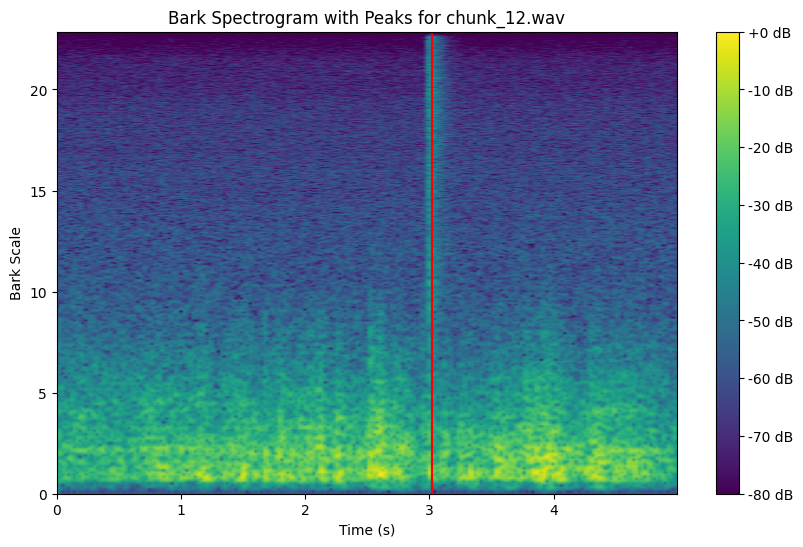

...

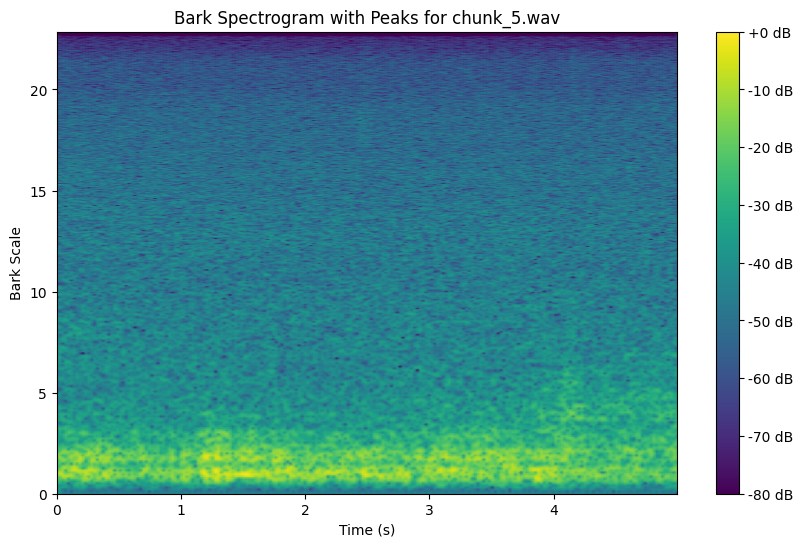

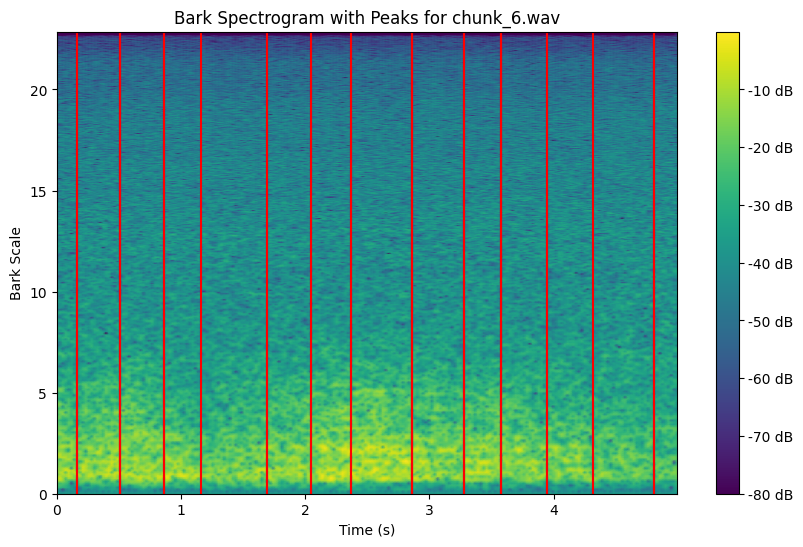

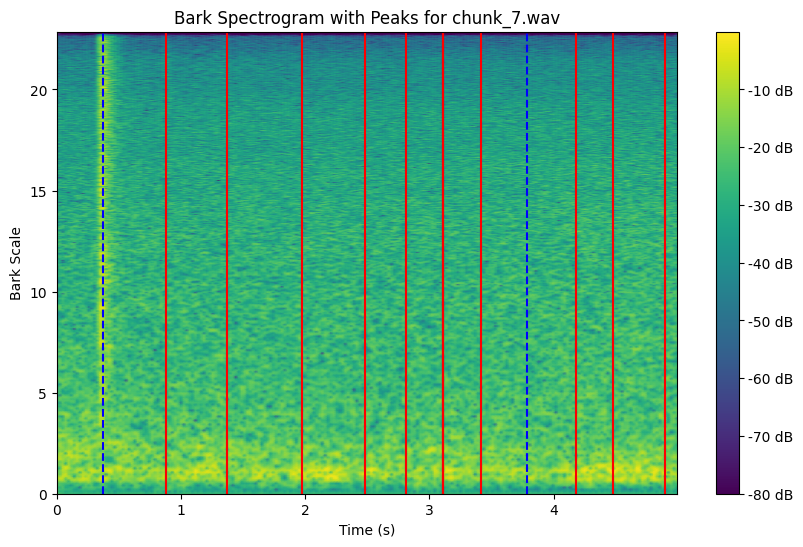

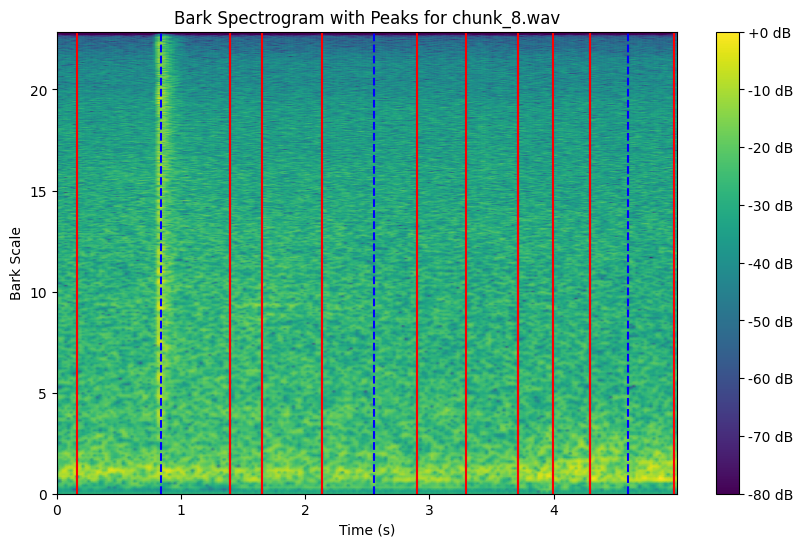

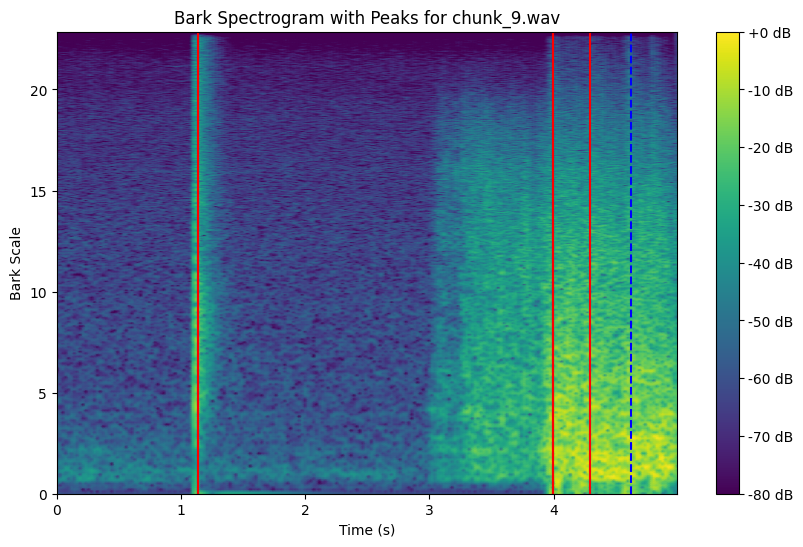

In [43]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def compare_peaks_with_cosine_similarity(peak1, peak2, similarity_threshold=0.9):
    """
    Compare two peaks using cosine similarity.
    """
    # Get the decibel and frequency values from the peaks
    decibels1 = peak1['decibels']
    decibels2 = peak2['decibels']
    
    # Normalize the decibel values to avoid scale differences
    decibels1_norm = decibels1 / np.linalg.norm(decibels1)
    decibels2_norm = decibels2 / np.linalg.norm(decibels2)
    
    # Calculate cosine similarity between the two peaks
    similarity = cosine_similarity([decibels1_norm], [decibels2_norm])[0][0]
    
    # Return True if similarity exceeds the threshold
    return similarity >= similarity_threshold

def find_similar_peaks(audio_list1, audio_list2, similarity_threshold=0.9):
    """
    Find similar peaks in audio_list2 compared to audio_list1 using cosine similarity.
    """
    audio_similar = []
    
    for audio_entry2 in audio_list2:
        peaks2 = audio_entry2['peaks_list']
        similar_peaks = []
        
        for peak2 in peaks2:
            # Check this peak against all peaks in audio_list1
            for audio_entry1 in audio_list1:
                peaks1 = audio_entry1['peaks_list']
                
                for peak1 in peaks1:
                    if compare_peaks_with_cosine_similarity(peak1, peak2, similarity_threshold):
                        similar_peaks.append({
                            'peak_time': peak2['time'],
                            'frequencies': peak2['frequencies'],
                            'decibels': peak2['decibels']
                        })
                        break  # Found a match, no need to check further for this peak
                
        audio_similar.append({
            'audio_file': audio_entry2['audio_file'],
            'spectrogram': audio_entry2['spectrogram'],
            'similar_peaks': similar_peaks,
            'normal_peaks': peaks2  # You can separate out normal peaks if needed
        })
    
    return audio_similar

# Now, to visualize the similar peaks in the spectrograms:
def plot_spectrogram_with_similar_peaks(audio_similar, sr, hop_length=512, n_fft=2048):
    """
    Plot the spectrogram with both normal and similar peaks highlighted.
    """
    for audio_entry in audio_similar:
        S = audio_entry['spectrogram']
        similar_peaks = audio_entry['similar_peaks']
        normal_peaks = audio_entry['normal_peaks']
        
        # Convert frequency axis to Bark scale
        frequencies = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
        bark_frequencies = hz_to_bark(frequencies)

        # Compute the time and Bark-frequency meshgrid
        time = librosa.frames_to_time(np.arange(S.shape[1]), sr=sr, hop_length=hop_length)

        # Plot the Bark spectrogram using the meshgrid
        plt.figure(figsize=(10, 6))
        plt.pcolormesh(time, bark_frequencies, librosa.amplitude_to_db(S, ref=np.max), shading='gouraud', cmap='viridis')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Bark Spectrogram with Peaks for {audio_entry["audio_file"]}')
        plt.ylabel('Bark Scale')
        plt.xlabel('Time (s)')

        # Mark the normal peaks (blue)
        for peak in normal_peaks:
            plt.axvline(x=peak['time'], color='blue', linestyle='--', label='Peak')

        # Mark the similar peaks (red)
        for peak in similar_peaks:
            plt.axvline(x=peak['peak_time'], color='red', linestyle='-', label='Similar Peak')
            
        plt.show()
        
# Example usage:
similar_audio_peaks = find_similar_peaks(audio_list1, audio_list2, similarity_threshold=0.7)

# Visualize the similar peaks in the spectrogram
plot_spectrogram_with_similar_peaks(similar_audio_peaks, sr=22050)
